$$
    \frac{\partial \phi_i}{\partial t} = - \mathcal{L}_i \cdot
\frac{\delta F}{\delta \phi_i} \quad i = 1, 2, \ldots, N
$$

Here, F represents the total free energy of the system, consisting of bulk energy density f and the gradient energy penalty associated with the interfaces of different grains.

\begin{equation}
    F = \int_V \left[ f(\phi_1, \phi_2, \ldots, \phi_N) + \sum_i^N \frac{\kappa_i}{2} \left| \nabla \phi_i \right|^2 \right] dv
\end{equation}

The bulk energy density function f is modeled using a multi-well potential for each grain order parameter $\phi_i$, penalizing overlaps between grains through the interaction term with coefficient $\gamma$

\begin{equation}
 f(\phi_1, \phi_2, \ldots, \phi_N) = \sum_{i=1}^{N} \left( -\frac{1}{2} \alpha \phi_i^2 + \frac{1}{4} \beta \phi_i^4 \right) + \gamma \sum_{i=1}^{N} \sum_{j \ne i}^{N} \phi_i^2 \phi_j^2   
\end{equation}

Taking the functional derivative of F with respect to gives us the driving force for the evolution of each grain, combining local bulk terms and gradient penalty terms.

\begin{equation}
    \frac{\delta F}{\delta \phi_i} = \frac{\partial f}{\partial \phi_i} -  \kappa_i \nabla^2 \phi_i
\end{equation}

Computing the partial derivative of f with respect to, we obtain contributions from self-interaction and interactions with neighboring grains.

\begin{equation}
   \frac{\partial f}{\partial \phi_i} = - \alpha \phi_i + \beta \phi_i^3 + 2 \gamma \phi_i \sum_{i \ne j}^{N} \phi_j^2
\end{equation}

Substituting this into the expression for $\frac{\delta F}{\delta \phi_i}$, we get the explicit form of the variational derivative governing the evolution of $\phi_i$.

\begin{equation}
    \frac{\delta F}{\delta \phi_i} =  - \alpha \phi_i + \beta \phi_i^3 + 2 \gamma \phi_i \sum_{i \ne j}^{N} \phi_j^2 -\kappa_i \nabla^2 \phi_i
\end{equation}

Finally, substituting into the governing equation (Eq 1), we obtain the time evolution equation for each order parameter which is a multivariate Allen-Cahn type equation.

\begin{equation}
    \frac{\partial \phi_i}{\partial t} = - \mathcal{L}_i \left(- \alpha \phi_i + \beta \phi_i^3 + 2 \gamma \phi_i \sum_{i \ne j}^{N} \phi_j^2 -\kappa_i \nabla^2 \phi_i\right)  \quad i = 1, 2, \ldots, N
\end{equation}



\begin{equation}
    \frac{\partial \phi_i}{\partial t} = - \mathcal{L}_i \frac{\partial f}{\partial \phi_i} + \mathcal{L}_i \kappa_i \nabla^2 \phi_i  \quad i = 1, 2, \ldots, N
\end{equation}

\noindent Applying Fourier transform to both sides of Eq.~\ref{eq:1}, the Laplacian term $\nabla^2 \phi_i$ transforms to $-(2\pi k)^2 \tilde{\phi_i}$ in Fourier space.


\begin{equation}
    \frac{\partial \tilde{\phi_i}}{\partial t} = - \mathcal{L}_i \frac{\partial \tilde{f}}{\partial \phi_i} + (2\pi i k)^2 \mathcal{L}_i \kappa_i \tilde{\phi_i}  
\end{equation}

\noindent Using a forward difference scheme for the time derivative, the discretized form of the equation in Fourier space becomes:

\begin{equation}
    \frac{\tilde{\phi_i}^{n+1} -\tilde{\phi_i}^{n}}{\Delta t} = - \mathcal{L}_i \frac{\partial \tilde{f}^n}{\partial \phi_i} -4 \pi^2 k^2 \mathcal{L}_i \kappa_i \tilde{\phi_i}^{n+1}  
\end{equation}

\noindent Defining $\tilde{g}(\phi_i)$ as the Fourier transform of the bulk free energy derivative evaluated at time step $n$:

\begin{equation}
    \tilde{g}(\phi_i)= \frac{\partial \tilde{f}^n}{\partial \phi_i}
\end{equation}

\noindent Rearranging the terms, the explicit expression for $\tilde{\phi_i}^{n+1}$ in Fourier space is obtained as:

\begin{equation}
    \tilde{\phi_i}^{n+1} =
\frac{\tilde{ \phi_i}^n - \Delta t \mathcal{L} \tilde{g}(\phi_i)^n}{1 + 4 \pi^2 \mathcal{L} \kappa k^2 \Delta t
}
\end{equation}

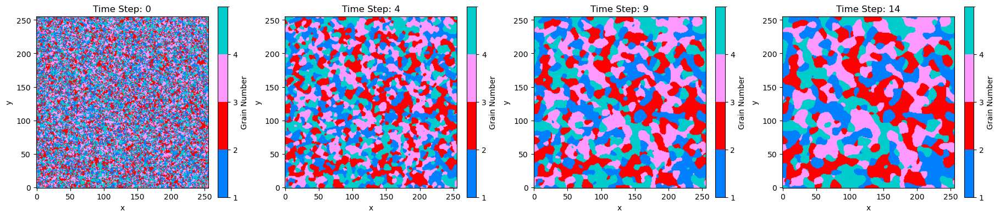

In [10]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from matplotlib import colors as mcolors
from IPython.display import display, HTML
import time
from matplotlib.colors import ListedColormap, BoundaryNorm

# Parameters
Nx = Ny = 256
dx = dy = 1.0
dt = 0.1
nstep = 20
print_step = 1
Ngrains = 4

# Model parameters
alpha = 0.5
beta = 2.5
gamma = 1.0
L = 1
kappa = 10.0

# Set random seed
np.random.seed(0)

# Initialize phi and eta arrays
phi = np.random.randint(Ngrains, size=(Nx, Ny))
eta = {i: np.zeros((Nx, Ny)) for i in range(1, Ngrains + 1)}
for i in range(Nx):
    for j in range(Ny):
        eta[phi[i, j] + 1][i, j] = 1

# Fourier variables
kx = np.fft.fftfreq(Nx, d=dx) * 2 * np.pi
ky = np.fft.fftfreq(Ny, d=dy) * 2 * np.pi
KX, KY = np.meshgrid(kx, ky)
kpow2 = KX**2 + KY**2

# Store grain maps
grain_maps = []

# Start timing the simulation
start_time = time.time()

# Time evolution
for step in range(nstep):
    etas_new = np.zeros((Ngrains, Nx, Ny))
    
    for i in range(1, Ngrains + 1):
        eta_i = eta[i]
        sum_eta_j_sq = np.sum([eta[j]**2 for j in range(1, Ngrains + 1) if j != i], axis=0)

        g = -alpha * eta_i + beta * eta_i**3 + 2 * gamma * eta_i * sum_eta_j_sq
        g_hat = np.fft.fft2(g)
        eta_hat = np.fft.fft2(eta_i)

        numerator = eta_hat - dt * L * g_hat
        denominator = 1 + dt * L * kappa * kpow2
        eta_i_new = numerator / denominator
        etas_new[i-1] = np.real(np.fft.ifft2(eta_i_new))

    # Update eta fields
    for i in range(1, Ngrains + 1):
        eta[i] = etas_new[i - 1].copy()
        
    # Record grain maps
    if step % print_step == 0:
        grain_map = np.argmax(etas_new, axis=0) + 1
        grain_maps.append(grain_map.copy())

# End timing the simulation
end_time = time.time()
total_time = end_time - start_time

# default_colors = np.array([
#     [102, 194, 165],  # Soft Teal Green
#     [252, 141, 98],   # Coral Orange
#     [141, 160, 203],  # Dusty Blue
#     [231, 138, 195],  # Vibrant Pink
#     [166, 216, 84],   # Fresh Green
#     [255, 217, 47],   # Golden Yellow
#     [229, 196, 148],  # Sand Tan
#     [179, 179, 179],  # Neutral Gray
#     [188, 128, 189],  # Orchid Purple
#     [117, 205, 253],  # Bright Sky Blue
# ]) / 255.0




# default_colors = np.array([
#     [239, 71, 111],   # Raspberry Red
#     [255, 209, 102],  # Soft Amber
#     [6, 214, 160],    # Minty Green
#     [17, 138, 178],   # Deep Teal
#     [7, 59, 76],      # Charcoal Blue
#     [255, 127, 80],   # Coral
#     [142, 202, 230],  # Sky Blue
#     [255, 183, 3],    # Saffron
#     [131, 56, 236],   # Vivid Violet
#     [58, 134, 255]    # Vivid Blue
# ]) / 255.0

default_colors = np.array([
    [0, 128, 255],   # Muted Blue
    [255, 0, 0],   # Vibrant Orange
    [255, 153, 255],    # Green
    [0, 204, 204],    # Red
    [148, 103, 189],  # Purple
    [140, 86, 75],    # Brown
    [255, 217, 47],  # Pink
    [127, 127, 127],  # Gray
    [188, 189, 34],   # Olive
    [23, 190, 207]    # Cyan
]) / 255.0


if Ngrains <= len(default_colors):
    grain_colors = default_colors[:Ngrains]
else:
    rng = np.random.default_rng(42)
    grain_colors = rng.uniform(0, 1, size=(Ngrains, 3))

# Create a custom colormap using the grain_colors
cmap = ListedColormap(grain_colors)

# Create a BoundaryNorm for the colorbar to map grain numbers to colors
norm = BoundaryNorm(boundaries=np.arange(1, Ngrains + 2), ncolors=Ngrains)

# --- Plot 5 snapshots ---
fig, axs = plt.subplots(1, 4, figsize=(22, 10))
steps_to_plot = np.linspace(0, len(grain_maps) - 1, 5, dtype=int)

for i, ax in enumerate(axs):
    rgb_image = grain_colors[grain_maps[steps_to_plot[i]] - 1]  # Notice the "-1" because grain_maps is 1-based
    im = ax.imshow(rgb_image, origin='lower', cmap=cmap, norm = norm)
    ax.set_title(f'Time Step: {steps_to_plot[i] * print_step}')
    ax.set_xlabel('x')
    ax.set_ylabel('y')
#     ax.axis('off')

# Add colorbar to the snapshots
    cbar = fig.colorbar(im, ax=ax, orientation='vertical', fraction=0.05, pad=0.05)
    cbar.set_ticks(np.arange(1, Ngrains + 1))
    cbar.set_label('Grain Number')
    
    
    
# fig, axs = plt.subplots(1, 4, figsize=(20, 5))  # Wider for colorbars
# steps_to_plot = np.linspace(0, len(grain_maps) - 1, 5, dtype=int)

# for i, ax in enumerate(axs):
#     rgb_image = grain_colors[grain_maps[steps_to_plot[i]] - 1]
#     im = ax.imshow(rgb_image, origin='lower', cmap=cmap, norm=norm)
#     ax.set_title(f'Time Step: {steps_to_plot[i] * print_step}')
#     ax.axis('off')

#     # Add colorbar to each subplot
#     cbar = fig.colorbar(im, ax=ax, orientation='vertical', fraction=0.05, pad=0.02)
#     cbar.set_ticks(np.arange(1, Ngrains + 1))
#     cbar.set_label('Grain Number')
    
    
# Adjust layout to avoid tight_layout warning
fig.subplots_adjust(wspace=0.3, hspace=0.3)  # Modify spacing

plt.show()

# --- Animation ---
fig2, ax2 = plt.subplots(figsize=(6, 6))
# Use the colormap for the first frame
rgb_image0 = grain_colors[grain_maps[0] - 1]
im = ax2.imshow(rgb_image0, origin='lower', cmap=cmap, norm=norm)
ax2.set_xlabel('x')
ax2.set_ylabel('y')
# ax2.axis('off')

# Add colorbar to the animation
cbar = fig2.colorbar(im, ax=ax2, orientation='vertical', fraction=0.05, pad=0.05, norm=norm)
cbar.set_ticks(np.arange(1, Ngrains + 1))
cbar.set_label('Grain Number')

def update(frame):
    # Update the image for each frame
    rgb_image = grain_colors[grain_maps[frame] - 1]
    im.set_array(rgb_image)
#     ax2.set_title(f'Time = {frame * print_step * dt:.2f} s')
    ax2.set_title(f'Time Step: {frame * print_step}')
    return [im]

ani = FuncAnimation(fig2, update, frames=len(grain_maps), interval=200, blit=True)
plt.close()

# Display the animation
display(HTML(ani.to_jshtml()))


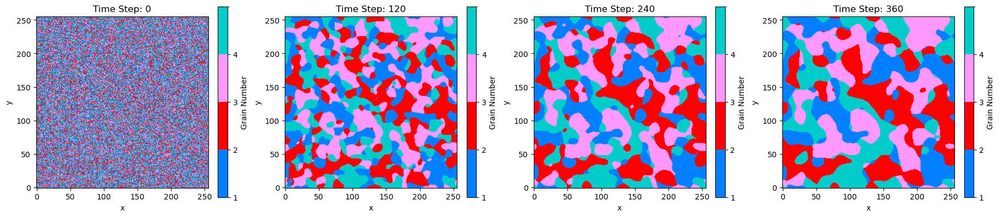

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from matplotlib import colors as mcolors
from IPython.display import display, HTML
import time
from matplotlib.colors import ListedColormap, BoundaryNorm

# Parameters
Nx = Ny = 256
dx = dy = 1.0
dt = 1e-2
nstep = 200
print_step = 10
Ngrains = 4

# Model parameters
alpha = 0.5
beta = 2.5
gamma = 1.0
L = 1
kappa = 10.0

# Set random seed
np.random.seed(0)

# Initialize phi and eta arrays
phi = np.random.randint(Ngrains, size=(Nx, Ny))
eta = {i: np.zeros((Nx, Ny)) for i in range(1, Ngrains + 1)}
for i in range(Nx):
    for j in range(Ny):
        eta[phi[i, j] + 1][i, j] = 1

# Helper: Compute Laplacian using finite differences
def laplacian(f, dx, dy):
    return (
        (np.roll(f, -1, axis=0) + np.roll(f, 1, axis=0) - 2*f) / dx**2 +
        (np.roll(f, -1, axis=1) + np.roll(f, 1, axis=1) - 2*f) / dy**2
    )

# Store grain maps
grain_maps = []

# Start timing the simulation
start_time = time.time()

# Time evolution
for step in range(nstep):
    etas_new = np.zeros((Ngrains, Nx, Ny))

    for i in range(1, Ngrains + 1):
        eta_i = eta[i]
        sum_eta_j_sq = np.sum([eta[j]**2 for j in range(1, Ngrains + 1) if j != i], axis=0)

        g = -alpha * eta_i + beta * eta_i**3 + 2 * gamma * eta_i * sum_eta_j_sq
        lap_eta = laplacian(eta_i, dx, dy)

        eta_i_new = eta_i - dt * L * (g - kappa * lap_eta)
        etas_new[i-1] = eta_i_new

    # Update eta fields
    for i in range(1, Ngrains + 1):
        eta[i] = etas_new[i-1]

    # Record grain maps
    if step % print_step == 0:
        grain_map = np.argmax(etas_new, axis=0) + 1  # 1-based grain index
        grain_maps.append(grain_map.copy())

# End timing the simulation
end_time = time.time()
total_time = end_time - start_time

default_colors = np.array([
    [0, 128, 255],   # Muted Blue
    [255, 0, 0],   # Vibrant Orange
    [255, 153, 255],    # Green
    [0, 204, 204],    # Red
    [148, 103, 189],  # Purple
    [140, 86, 75],    # Brown
    [255, 217, 47],  # Pink
    [127, 127, 127],  # Gray
    [188, 189, 34],   # Olive
    [23, 190, 207]    # Cyan
]) / 255.0


if Ngrains <= len(default_colors):
    grain_colors = default_colors[:Ngrains]
else:
    rng = np.random.default_rng(42)
    grain_colors = rng.uniform(0, 1, size=(Ngrains, 3))

# Create a custom colormap using the grain_colors
cmap = ListedColormap(grain_colors)

# Create a BoundaryNorm for the colorbar to map grain numbers to colors
norm = BoundaryNorm(boundaries=np.arange(1, Ngrains + 2), ncolors=Ngrains)

# --- Plot 5 snapshots ---
fig, axs = plt.subplots(1, 4, figsize=(22, 10))
steps_to_plot = np.linspace(0, len(grain_maps) - 1, 5, dtype=int)

for i, ax in enumerate(axs):
    rgb_image = grain_colors[grain_maps[steps_to_plot[i]] - 1]  # Notice the "-1" because grain_maps is 1-based
    im = ax.imshow(rgb_image, origin='lower', cmap=cmap, norm = norm)
    ax.set_title(f'Time Step: {steps_to_plot[i] * print_step}')
    ax.set_xlabel('x')
    ax.set_ylabel('y')
#     ax.axis('off')

# Add colorbar to the snapshots
    cbar = fig.colorbar(im, ax=ax, orientation='vertical', fraction=0.05, pad=0.05)
    cbar.set_ticks(np.arange(1, Ngrains + 1))
    cbar.set_label('Grain Number')
    
    
    
# fig, axs = plt.subplots(1, 4, figsize=(20, 5))  # Wider for colorbars
# steps_to_plot = np.linspace(0, len(grain_maps) - 1, 5, dtype=int)

# for i, ax in enumerate(axs):
#     rgb_image = grain_colors[grain_maps[steps_to_plot[i]] - 1]
#     im = ax.imshow(rgb_image, origin='lower', cmap=cmap, norm=norm)
#     ax.set_title(f'Time Step: {steps_to_plot[i] * print_step}')
#     ax.axis('off')

#     # Add colorbar to each subplot
#     cbar = fig.colorbar(im, ax=ax, orientation='vertical', fraction=0.05, pad=0.02)
#     cbar.set_ticks(np.arange(1, Ngrains + 1))
#     cbar.set_label('Grain Number')
    
    
# Adjust layout to avoid tight_layout warning
fig.subplots_adjust(wspace=0.3, hspace=0.3)  # Modify spacing

plt.show()

# --- Animation ---
fig2, ax2 = plt.subplots(figsize=(6, 6))
# Use the colormap for the first frame
rgb_image0 = grain_colors[grain_maps[0] - 1]
im = ax2.imshow(rgb_image0, origin='lower', cmap=cmap, norm=norm)
ax2.set_xlabel('x')
ax2.set_ylabel('y')
# ax2.axis('off')

# Add colorbar to the animation
cbar = fig2.colorbar(im, ax=ax2, orientation='vertical', fraction=0.05, pad=0.05, norm=norm)
cbar.set_ticks(np.arange(1, Ngrains + 1))
cbar.set_label('Grain Number')

def update(frame):
    # Update the image for each frame
    rgb_image = grain_colors[grain_maps[frame] - 1]
    im.set_array(rgb_image)
#     ax2.set_title(f'Time = {frame * print_step * dt:.2f} s')
    ax2.set_title(f'Time Step: {frame * print_step}')
    return [im]

ani = FuncAnimation(fig2, update, frames=len(grain_maps), interval=200, blit=True)
plt.close()

# Display the animation
display(HTML(ani.to_jshtml()))